In [1]:
%reload_ext autoreload
%autoreload 0


import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

df = pd.read_csv("data/df_gebrauchtwagenpreise_2019.csv")
df.describe(include="all")

,Unnamed: 0,model,kw,mark,new,2018,2017,2016,2015,2014,2013,2012
count,7719.000000,7719,7719.000000,7719,7719.000000,3124.000000,3068.000000,2903.000000,3622.00000,3255.000000,3147.000000,2106.000000
unique,NaN,6348,NaN,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Insignia Sports Tourer 2.0 CDTI ecoFlex Start&...,NaN,Mercedes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,9,NaN,833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3859.000000,NaN,135.680010,NaN,38996.981215,27918.069782,24808.767927,20650.516707,17432.46825,14940.491551,13097.036861,11504.831434
std,2228.427697,NaN,77.474149,NaN,27580.800577,21595.806020,19940.722569,15194.138083,12673.17624,11342.561790,9973.925725,9698.676544
min,0.000000,NaN,4.000000,NaN,6890.000000,6025.000000,5525.000000,4100.000000,3875.00000,3450.000000,2800.000000,2550.000000
25%,1929.500000,NaN,85.000000,NaN,22875.000000,16050.000000,13800.000000,12350.000000,10500.00000,9075.000000,7950.000000,6925.000000
50%,3859.000000,NaN,110.000000,NaN,31590.000000,21925.000000,19100.000000,16550.000000,13950.00000,11800.000000,10350.000000,9025.000000
75%,5788.500000,NaN,153.500000,NaN,44415.000000,31200.000000,27712.500000,22950.000000,19250.00000,16750.000000,14850.000000,12937.500000


# Move to percentages

In [2]:
df.head()

,Unnamed: 0,model,kw,mark,new,2018,2017,2016,2015,2014,2013,2012
0,0,124 Spider (NF ),125,Abarth,33000,24150.0,23000.0,21400.0,NaN,NaN,NaN,NaN
1,1,595 Custom (312),103,Abarth,21490,NaN,NaN,NaN,13150.0,11900.0,10900.0,NaN
2,2,595 Competizione (312),132,Abarth,24250,NaN,NaN,14400.0,12900.0,NaN,NaN,NaN
3,3,695 Biposto (312),139,Abarth,39900,30050.0,26850.0,23950.0,21400.0,19100.0,NaN,NaN
4,4,595C Custom (312),99,Abarth,20190,NaN,NaN,NaN,12350.0,11200.0,10200.0,NaN


In [3]:
years = list(range(2018, 2011, -1))
years_s = [str(y) for y in years]
years_s_with_new = ["new"] + [str(y) for y in years]


def years_to_percentage(x):
    x[years_s_with_new] = x[years_s_with_new] / x["new"]
    return x


df = df.apply(years_to_percentage, axis=1)

# change years to years since
all_years = [max(years) + 1, *years]
years_since = [max(all_years) - y for y in all_years]

years_mapping = dict(zip(years_s_with_new, years_since))


df = df.rename(columns=years_mapping)

df.head()

{'new': 0, '2018': 1, '2017': 2, '2016': 3, '2015': 4, '2014': 5, '2013': 6, '2012': 7}


,Unnamed: 0,model,kw,mark,0,1,2,3,4,5,6,7
0,0,124 Spider (NF ),125,Abarth,1.0,0.731818,0.696970,0.648485,NaN,NaN,NaN,NaN
1,1,595 Custom (312),103,Abarth,1.0,NaN,NaN,NaN,0.611913,0.553746,0.507213,NaN
2,2,595 Competizione (312),132,Abarth,1.0,NaN,NaN,0.593814,0.531959,NaN,NaN,NaN
3,3,695 Biposto (312),139,Abarth,1.0,0.753133,0.672932,0.600251,0.536341,0.478697,NaN,NaN
4,4,595C Custom (312),99,Abarth,1.0,NaN,NaN,NaN,0.611689,0.554730,0.505201,NaN


# Plotting all data

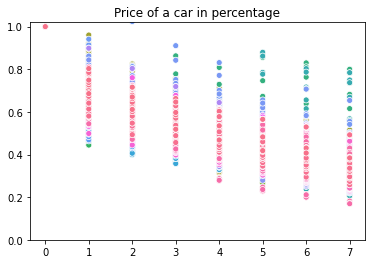

In [4]:
df_years = df[years_since]
d = df_years.transpose()
ax = sns.scatterplot(data=d, markers=False, legend=False)
ax.set(ylim=(0, 1.02))
ax.set_title("Price of a car in percentage")

# df_years[df_years[3] > 0.8]

## Check outlayers

In [5]:
df[(df[years_since] > 1).any(axis=1)]

,Unnamed: 0,model,kw,mark,0,1,2,3,4,5,6,7
5405,5405,911 R (991),368,Porsche,1.0,NaN,1.316053,1.228738,NaN,NaN,NaN,NaN
5411,5411,911 Turbo S Coupé Exclusive Series PDK (991),446,Porsche,1.0,1.069071,1.023878,NaN,NaN,NaN,NaN,NaN
5412,5412,911 GT2 RS PDK (991),515,Porsche,1.0,1.134913,1.087932,NaN,NaN,NaN,NaN,NaN


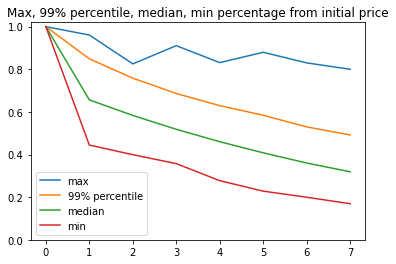

In [6]:
# Removing outlayers
def remove_outlayers(df):
    return df[((df[years_since] <= 1.0) | (pd.isna(df[years_since]))).all(axis=1)]


df_years = remove_outlayers(df_years)


def plot_basic_stat(df) -> None:
    ax = sns.lineplot(data=df.max(), markers=True)
    ax = sns.lineplot(data=df.quantile(0.99), markers=True)
    ax = sns.lineplot(data=df.median(), markers=True, ax=ax)
    ax = sns.lineplot(data=df.min(), markers=True, ax=ax)
    ax.legend(["max", "99% percentile", "median", "min"])
    ax.set(ylim=(0, 1.02))
    ax.set_title("Max, 99% percentile, median, min percentage from initial price")


plot_basic_stat(df_years)

In [7]:
def get_df_stats(df):
    stats_df = pd.DataFrame()
    stats_df["max"] = df.max()
    stats_df["percentile 99%"] = df.quantile(0.99)
    stats_df["median"] = df.median()
    stats_df["min"] = df.min()
    return stats_df.transpose()


get_df_stats(df_years)

,0,1,2,3,4,5,6,7
max,1.0,0.960576,0.825221,0.910626,0.831196,0.879677,0.829899,0.799925
percentile 99%,1.0,0.849074,0.758274,0.686416,0.629287,0.584233,0.529580,0.491768
median,1.0,0.656510,0.583333,0.518383,0.460124,0.408024,0.360141,0.319141
min,1.0,0.444444,0.399358,0.357324,0.277405,0.228188,0.199664,0.169286


## Plotting per mark

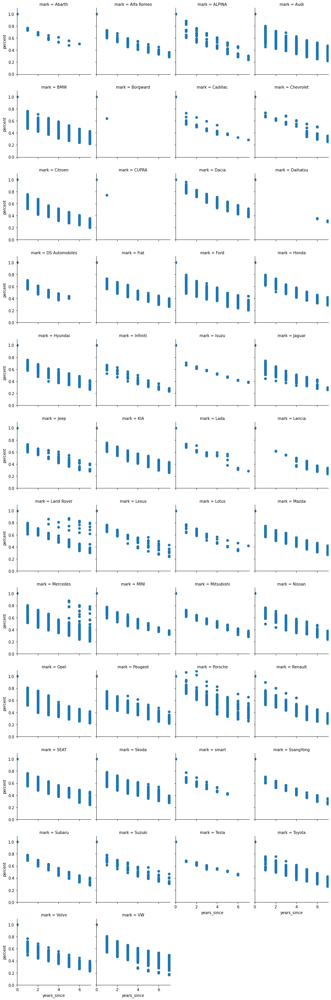

In [8]:
d = []
for i, row in df.iterrows():
    for year in years_since:
        if not pd.isna(row[year]):
            d.append(
                {
                    "mark": row["mark"],
                    "years_since": year,
                    "percent": row[year],
                }
            )

ndf = pd.DataFrame(d)

g = sns.FacetGrid(ndf, col="mark", col_wrap=4)
g.map(plt.scatter, "years_since", "percent").set(ylim=(0, 1.1), xlim=(0, 7.1))

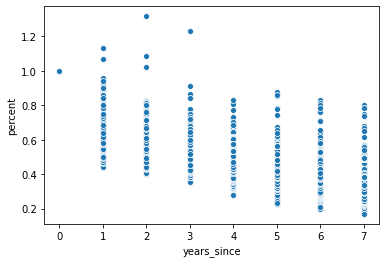

In [9]:
sns.scatterplot(x="years_since", y="percent", data=ndf)

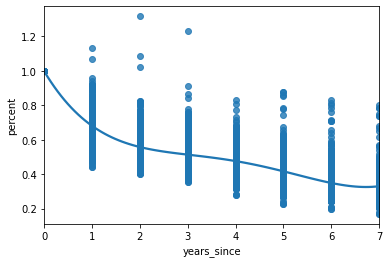

In [10]:
ax = sns.regplot(x="years_since", y="percent", data=ndf, order=4)

mark,Audi,BMW,Ford,MINI,Mercedes,Opel,VW,smart
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.647176,0.601649,0.614615,0.694873,0.634508,0.635993,0.673081,0.681648
2,0.568810,0.536984,0.543875,0.612868,0.562557,0.555115,0.601665,0.604348
3,0.517989,0.483950,0.481204,0.555699,0.507181,0.489084,0.536944,0.550096
4,0.457031,0.434579,0.437047,0.497553,0.454827,0.419471,0.474807,0.482860
5,0.418513,0.392426,0.384779,0.444040,0.406690,0.383199,0.420609,0.423990
6,0.374367,0.351568,0.345971,0.398879,0.362223,0.334281,0.379926,NaN
7,0.333240,0.312318,0.310072,0.351368,0.329022,0.300227,0.341428,NaN


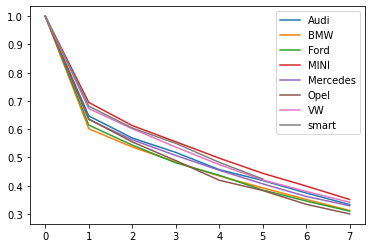

In [11]:
mdf = df.groupby("mark", as_index=False).mean()

marks = [
    # 'Alfa Romeo',
    "Audi",
    "BMW",
    # 'Citroen',
    "Ford",
    # 'Honda',
    # 'Hyundai',
    # 'Jeep',
    # 'KIA',
    # 'Land Rover',
    # 'Lexus',
    "MINI",
    # 'Mazda',
    "Mercedes",
    # 'Mitsubishi',
    # 'Nissan',
    "Opel",
    # 'Peugeot',
    # 'Renault',
    # 'SEAT',
    # 'Skoda',
    # 'Subaru',
    # 'Suzuki',
    # 'Tesla',
    # 'Toyota',
    "VW",
    # 'Volvo',
    "smart",
]

fmdf = mdf[mdf["mark"].isin(marks)][["mark", *years_since]]

fmdf = fmdf.set_index("mark").transpose()
sns.lineplot(data=fmdf, dashes=False)
fmdf.head(10)

In [62]:
cmp = df[["mark", "model", *years_since]]
cmp["model"] = cmp["model"].apply(lambda x: x.split(" ")[0])
cmp = cmp.groupby(["mark", "model"], as_index=False).mean()
# my cars
cmp[
    cmp["model"].isin(
        [
            "Impreza",
            "Golf",
            "A",
            "A3",
            "Octavia",
            "Leon",
            "Focus",
            "Astra",
            "cee´d",
            "1",
            "Corolla",
        ]
    )
].sort_values(years_since[5:], ascending=False)

# all cars
# cmp[pd.notna(cmp[1])].sort_values(years_since[5:], ascending=False).head(60).reset_index()

# cmp[cmp['mark'] == 'BMW'][cmp['model'].str.startswith('1')].groupby(['mark'], as_index=False).mean()
# BMW	1.0	0.61158	0.543829	0.499205	0.457045	0.39829	0.389676	0.352571

,mark,model,0,1,2,3,4,5,6,7
519,Toyota,Corolla,1.0,0.729554,0.683086,0.611059,0.525234,0.477087,NaN,NaN
498,Subaru,Impreza,1.0,0.732127,0.652944,0.572245,0.526305,0.474199,0.363395,0.308581
485,Skoda,Octavia,1.0,0.686761,0.616550,0.551209,0.509907,0.471420,0.415018,0.344513
478,SEAT,Leon,1.0,0.647879,0.581171,0.533319,0.497189,0.467918,0.417805,0.391960
350,Mercedes,A,1.0,0.635405,0.565051,0.518247,0.488442,0.458086,0.435275,0.403682
20,Audi,A3,1.0,0.639901,0.578345,0.525494,0.481028,0.447437,0.417299,0.377154
299,KIA,cee´d,1.0,0.697352,0.623515,0.557866,0.498777,0.437216,0.391929,0.346141
542,VW,Golf,1.0,0.662523,0.600384,0.539801,0.483456,0.433547,0.389151,0.341554
413,Opel,Astra,1.0,0.610610,0.553041,0.498885,0.440782,0.390318,0.346509,0.316401
218,Ford,Focus,1.0,0.614041,0.534786,0.484549,0.433746,0.381842,0.341977,0.313289
